# Title: Analysis of Intergenerational Mobility in Education

This notebook explores the ABM generated data of different scenarios and replications.

In [86]:
import mesa
import numpy as np
import random
import networkx as nx 
import bisect
from pathlib import Path
import os
import sys
import csv
import pandas as pd

# Basic paths
src_path = str(Path.cwd().parent / "scripts")
sys.path.append(src_path)

project_path = Path().resolve().parent
csv_path = project_path / "data"

# Python file stored in script folder
from data_cleaning import *

# Raw Data
🔹 Useful for step-wise analyses. \
🔹 All the agents' information at each step.

In [87]:
'''
    Read raw data
'''
num_scen = 5
num_reps = 10

rdfs = []
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        file_name = f"scenario{j}_rep{i}.csv"
        rdf = pd.read_csv(csv_path/file_name)
        rdf['Scenario'] = j
        rdf['Replication'] = i
        rdfs.append(rdf)

In [38]:
rdfs[0]

,Step,AgentID,Age,Education,Gender,Income,Spouse,Parents,Generation,Cohort,Children,Weight,Capital,Brut,Scenario,Replication
0,0,0,22,4,M,383.912,NaN,[],1,2,"[525, 722]","[4, 9, 6]","[0.56, 0.456, 0]",NaN,1,1
1,0,1,59,2,F,572.317,NaN,[],1,1,[],"[3, 7, 9]","[0.26, 0.608, 0]",NaN,1,1
2,0,2,46,2,F,207.210,NaN,[],1,1,[],"[3, 4, 7]","[0.26, 0.181, 0]",NaN,1,1
3,0,3,31,1,M,524.950,NaN,[],1,2,[],"[1, 7, 8]","[0.11, 0.558, 0]",NaN,1,1
4,0,4,30,3,F,208.252,NaN,[],1,2,"[633, 668]","[7, 5, 4]","[0.51, 0.195, 0]",NaN,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148686,499,5328,10,4,M,679.790,NaN,"[5301, 5276]",53,55,[],"[7, 7, 1]","[0.68, 0.722, 0.97]",32.0,1,1
148687,499,5329,10,5,M,773.909,NaN,"[5303, 5293]",53,55,[],"[4, 3, 1]","[0.7, 0.629, 0.912]",31.0,1,1
148688,499,5330,8,4,M,782.493,NaN,"[5303, 5293]",53,55,[],"[1, 4, 1]","[0.44, 0.685, 0.97]",32.0,1,1
148689,499,5331,8,5,M,702.780,NaN,"[5306, 5300]",53,55,[],"[2, 7, 3]","[0.6, 0.747, 0.97]",32.0,1,1


# Data Cleaning
🔹 Useful when a flattened data for each agent is required. \
🔹 Here, you cannot analyze with regard to time steps.

In [88]:
"""
    Load the data
    Run this only if you already have the data sets. Otherwise, next line.
"""
num_scen = 5
num_reps = 10

dfs = []
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        file_name = f"s{j}r{i}_analysis.csv"
        df = pd.read_csv(csv_path/file_name, index_col=0)
        df['Scenario'] = j
        df['Replication'] = i
        dfs.append(df)

In [81]:
dfs[39][['Scenario', 'Replication', 'Edu_level', 'Spouse_Edu']]

,Scenario,Replication,Edu_level,Spouse_Edu
0,4,10,4,4.0
1,4,10,4,4.0
2,4,10,4,4.0
3,4,10,2,NaN
4,4,10,1,3.0
...,...,...,...,...
6521,4,10,4,4.0
6522,4,10,1,1.0
6523,4,10,4,4.0
6524,4,10,5,5.0


In [2]:
"""
    Run this only when data sets aren't provided. Warning: it takes long to run!! 
"""
# num_scen = 5
# num_reps = 10
# dfs = []
# for j in range(1, num_scen+1):
#     for i in range(1, num_reps+1):
#         file_name = f"scenario{j}_rep{i}.csv"
#         df = process_data(csv_path / file_name)
#         df['Scenario'] = j
#         df['Replication'] = i
#         dfs.append(df)

In [84]:
num_reps = 10
extra = []
for i in range(1, num_reps+1):
    file_name = f"scenario4_rep{i}.csv"
    df = process_data(csv_path / file_name)
    df['Scenario'] = 4
    df['Replication'] = i
    extra.append(df)

## Save CSV
🔻 Save the cleaened/processed data as CSV files (To analyze in R for Relative Mobility)

In [4]:
for i in range(1, num_scen*num_reps+1):
        df = dfs[i-1]
        # print('Scenario', df['Scenario'][0], 'Replication', df['Replication'][0])
        scen = df['Scenario'][0]
        rep = df['Replication'][0]
        df.to_csv(csv_path/f's{scen}r{rep}_analysis.csv')

In [85]:
for i in range(1, num_reps+1):
    df = extra[i-1]
    scen = df['Scenario'][0]
    rep = df['Replication'][0]
    df.to_csv(csv_path/f's4r{rep}_analysis.csv')

# Data Exporation

The following two plots allow a primitive view on how the scenarios differ. 

## Per Cohort

In [30]:
# Create dictionary of dataframes
df_last = pd.DataFrame()
row=0

for j in range(1, num_scen + 1):
    for i in range(1, num_reps + 1):
        df = dfs[row]
        size = df.groupby(['Cohort']).size().reset_index(name='Size')
        size['key'] = f"s{j}-r{i}"
        df_last = pd.concat([df_last, size], ignore_index=True)
        row += 1

filtered = df_last[df_last['Cohort']==3]
filtered.groupby(['key']).first() 

,Cohort,Size
key,,
s1-r1,3,209
s1-r10,3,213
s1-r2,3,228
s1-r3,3,209
s1-r4,3,204
s1-r5,3,216
s1-r6,3,206
s1-r7,3,225
s1-r8,3,204


In [35]:
df_last[df_last['Size'] < 60].groupby(['key']).first()

,Cohort,Size
key,,
s1-r1,46,54
s1-r10,48,58
s1-r2,38,56
s1-r3,41,56
s1-r4,38,48
s1-r5,46,54
s1-r6,56,56
s1-r7,35,47
s1-r8,42,58


In [32]:
df_last.groupby('Cohort')['Size'].var().reset_index().head(60)

,Cohort,Size
0,1,133.683265
1,2,130.009796
2,3,52.448980
3,4,63.949388
4,5,83.804490
5,6,105.073061
6,7,279.690204
7,8,413.428980
8,9,368.833061
9,10,386.034286


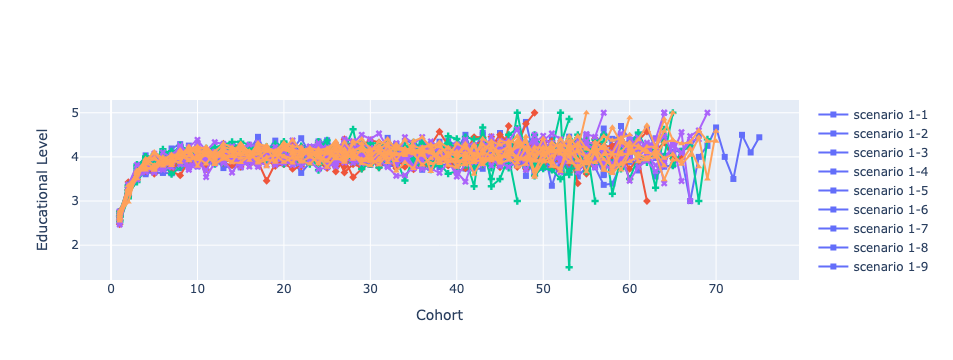

In [28]:
import plotly.graph_objects as go
import plotly.express as px


# Create dictionary of dataframes
df_dict = {}
row=0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        key = f"scenario {j}"
        df = dfs[row]
        df_mean = df.groupby(['Cohort'], as_index=False).Edu_level.mean()
        if key in df_dict:
            df_dict[key].append(df_mean)
        else:
            df_dict[key] = [df_mean]
        row += 1

# Create list of replications and scenarios
replications = [f"rep {i}" for i in range(1, num_reps+1)]
scenarios = [f"scenario {j}" for j in range(1, num_scen+1)]
colors = [px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[3], px.colors.qualitative.Plotly[4]]
# Create figure
fig = go.Figure()


# Loop through each scenario
for i, scenario in enumerate(scenarios):
    # Get dataframes for current scenario
    dfs_scenario = df_dict[scenario]
    # Get color for current scenario
    color = colors[i]
    # color = f"hsl({(i/len(scenarios))*360}, 50%, 50%)"
    # Loop through each replication of the current scenario
    for j, df in enumerate(dfs_scenario):
        # Get name for current replication
        name = f"{scenario}-{j+1}"
        fig.add_trace(go.Scatter(x=df["Cohort"], y=df["Edu_level"],
                                  name=name,
                                  mode="lines+markers",
                                  line=dict(color=color),
                                  marker=dict(symbol=int(scenario[-1]))))


fig.update_layout(
    xaxis_title="Cohort",
    yaxis_title="Educational Level",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
    # showlegend=False
)

# Show figure
fig.show()



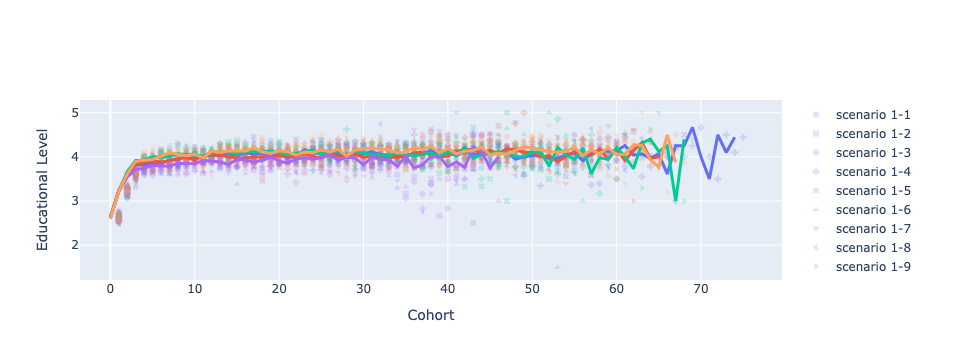

In [89]:
import plotly.graph_objects as go

# Create dictionary of dataframes
df_dict = {}
row=0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        key = f"scenario {j}"
        df = dfs[row]
        df_mean = df.groupby(['Cohort'], as_index=False).Edu_level.mean()
        if key in df_dict:
            df_dict[key].append(df_mean)
        else:
            df_dict[key] = [df_mean]
        row += 1

# Create list of replications and scenarios
replications = [f"rep {i}" for i in range(1, num_reps+1)]
scenarios = [f"scenario {j}" for j in range(1, num_scen+1)]
colors = [px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[3], px.colors.qualitative.Plotly[4]]

# Create figure
fig = go.Figure()

# Loop through each scenario
for i, scenario in enumerate(scenarios):
    # Get dataframes for current scenario
    dfs_scenario = df_dict[scenario]
    # Get color for current scenario
    color = colors[i]
    # Loop through each replication of the current scenario
    for j, df in enumerate(dfs_scenario):
        # Get name for current replication
        name = f"{scenario}-{j+1}"
        fig.add_trace(go.Scatter(x=df["Cohort"], y=df["Edu_level"],
                                  name=name,
                                  mode="markers",
                                  marker=dict(symbol=j, color=color, opacity=0.2)))


# To make the lines appear on top of the scatter, make a new loop
for i, scenario in enumerate(scenarios):
    dfs_scenario = df_dict[scenario]
    # color2 = f"hsl({(i/len(scenarios))*360}, 100%, 35%)"
    # Calculate the average line for the current scenario
    max_length = max(len(df) for df in dfs_scenario)
    avg_line = pd.concat([df.loc[:max_length-1, "Edu_level"] for df in dfs_scenario], axis=1).mean(axis=1)
    avg_line = avg_line.reset_index(name="Edu_level").rename(columns={"index": "Cohort"})
    
    # Add the average line as a trace
    fig.add_trace(go.Scatter(
        x=avg_line["Cohort"], y=avg_line["Edu_level"],
        name=f"{scenario} (Avg)",
        mode="lines",
        line=dict(color=colors[i], width=3),
    ))

fig.update_layout(
    xaxis_title="Cohort",
    yaxis_title="Educational Level",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
    # showlegend=False
)

# Show figure
fig.show()

In [295]:
fig.write_image(project_path/"images/general_trends_1.png", width=900, height = 500)

## Per Time Step (Raw Data)


In [39]:
# Create dictionary of dataframes
rdf_last = pd.DataFrame()
row=0

for j in range(1, num_scen + 1):
    for i in range(1, num_reps + 1):
        rdf = rdfs[row]
        size = rdf.groupby(['Step']).size().reset_index(name='Size')
        size['key'] = f"s{j}-r{i}"
        size['Scenario'] = j
        size['Replication'] = i
        rdf_last = pd.concat([rdf_last, size], ignore_index=True)
        row += 1

filtered2 = rdf_last[rdf_last['Size']<=200]
filtered2.groupby(['key']).first() 

,Step,Size,Scenario,Replication
key,,,,
s1-r1,286,199,1,1
s1-r10,401,191,1,10
s1-r2,374,198,1,2
s1-r3,265,199,1,3
s1-r4,355,198,1,4
s1-r5,403,199,1,5
s1-r6,476,199,1,6
s1-r7,273,192,1,7
s1-r8,404,199,1,8


In [40]:
filtered2 = rdf_last[rdf_last['Step']==300]
filtered2.groupby(['key']).first() 
# filtered2.groupby('Scenario')['Size'].mean()

,Step,Size,Scenario,Replication
key,,,,
s1-r1,300,235,1,1
s1-r10,300,363,1,10
s1-r2,300,368,1,2
s1-r3,300,242,1,3
s1-r4,300,346,1,4
s1-r5,300,248,1,5
s1-r6,300,453,1,6
s1-r7,300,132,1,7
s1-r8,300,255,1,8


In [41]:
last_step = pd.DataFrame()
row=0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        rdf = rdfs[row]
        last_step.loc[row, 'Scenario'] = j
        last_step.loc[row, 'Replication'] = i
        last_step.loc[row, 'last_step'] = rdf.Step.max()
        row += 1

In [42]:
last_step.groupby('Scenario').last_step.mean()

Scenario
1.0    497.5
2.0    465.6
3.0    452.5
4.0    483.3
5.0    495.3
Name: last_step, dtype: float64

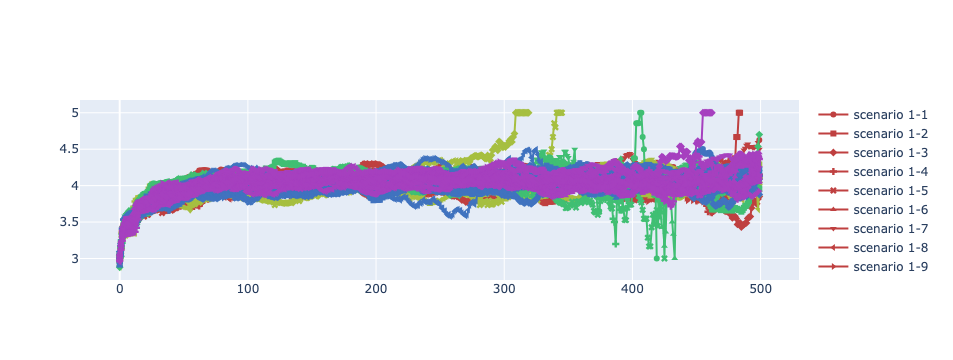

In [43]:
import plotly.graph_objects as go

# Create dictionary of dataframes
df_dict = {}
row=0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        key = f"scenario {j}"
        rdf = rdfs[row]
        df_mean = rdf.groupby(['Step'], as_index=False).Education.mean()
        if key in df_dict:
            df_dict[key].append(df_mean)
        else:
            df_dict[key] = [df_mean]
        row += 1

# Create list of replications and scenarios
replications = [f"rep {i}" for i in range(1, num_reps+1)]
scenarios = [f"scenario {j}" for j in range(1, num_scen+1)]

# Create figure
fig = go.Figure()

# Loop through each scenario
for i, scenario in enumerate(scenarios):
    # Get dataframes for current scenario
    dfs_scenario = df_dict[scenario]
    # Get color for current scenario
    color = f"hsl({(i/len(scenarios))*360}, 50%, 50%)"
    # Loop through each replication of the current scenario
    for j, rdf in enumerate(dfs_scenario):
        # Get name for current replication
        name = f"{scenario}-{j+1}"
        fig.add_trace(go.Scatter(x=rdf["Step"], y=rdf["Education"],
                                  name=name,
                                  mode="lines+markers",
                                  line=dict(color=color),
                                  marker=dict(symbol=j)))

# Show figure
fig.show()



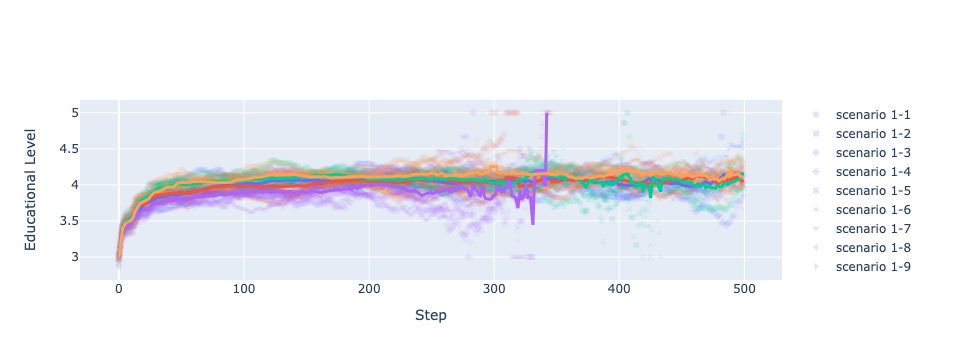

In [91]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

# Create dictionary of dataframes
df_dict = {}
row = 0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        key = f"scenario {j}"
        rdf = rdfs[row]
        df_mean = rdf.groupby(['Step'], as_index=False).Education.mean()
        if key in df_dict:
            df_dict[key].append(df_mean)
        else:
            df_dict[key] = [df_mean]
        row += 1

# Create list of replications and scenarios
replications = [f"rep {i}" for i in range(1, num_reps+1)]
scenarios = [f"scenario {j}" for j in range(1, num_scen+1)]
colors = [px.colors.qualitative.Plotly[0], px.colors.qualitative.Plotly[1], px.colors.qualitative.Plotly[2], px.colors.qualitative.Plotly[3], px.colors.qualitative.Plotly[4]] # Normally 3, 4 but I changed it because somehow I got them mixed

# Create figure
fig = go.Figure()

# Loop through each scenario
for i, scenario in enumerate(scenarios):
    # Get dataframes for current scenario
    dfs_scenario = df_dict[scenario]
    # Get color for current scenario
    color = colors[i]
    
    # Loop through each replication of the current scenario
    for j, rdf in enumerate(dfs_scenario):
        # Get name for current replication
        name = f"{scenario}-{j+1}"
        
        # Add scatter dots for each replication
        fig.add_trace(go.Scatter(
            x=rdf["Step"], y=rdf["Education"],
            name=name,
            mode="markers",
            marker=dict(symbol=j, color=color, opacity=0.07)
        ))


# To make the lines appear on top of the scatter, make a new loop
for i, scenario in enumerate(scenarios):
    dfs_scenario = df_dict[scenario]
    # Calculate the average line for the current scenario
    max_length = max(len(df) for df in dfs_scenario)
    avg_line = pd.concat([df.loc[:max_length-1, "Education"] for df in dfs_scenario], axis=1).mean(axis=1)
    avg_line = avg_line.reset_index(name="Education").rename(columns={"index": "Step"})
    
    # Add the average line as a trace
    fig.add_trace(go.Scatter(
        x=avg_line["Step"], y=avg_line["Education"],
        name=f"{scenario} (Avg)",
        mode="lines",
        line=dict(color=colors[i], width=3),
    ))

fig.update_layout(
    xaxis_title="Step",
    yaxis_title="Educational Level",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
    # showlegend=False
)

# Show figure
fig.show()


In [303]:
fig.write_image(project_path/"images/general_trends_2.png", width=900, height = 500)

# Absolute Mobility

## Method 1

In [92]:
absolute = pd.DataFrame(columns=["Scenario", "Replication", "Cohort", "Probability"])
row = 0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        df = dfs[row]
        am1 = df[(df['Mother_Edu'] < 5) & (df['Father_Edu'] <5)]
        am2 = df[(df['Mother_Edu'] == 5) | (df['Father_Edu'] ==5)]
        counts = am1[(am1['Edu_level'] > am1['Mother_Edu']) & (am1['Edu_level'] > am1['Father_Edu'])].groupby('Cohort').size()
        counts2 = am2[(am2['Edu_level'] == 5)].groupby('Cohort').size()
        totals = am1.groupby(['Cohort']).size()
        totals2 = am2.groupby('Cohort').size()
        probs = counts/totals
        probs2 = counts2 / totals2
        probs3 = probs2 + probs
        temp = pd.DataFrame({"Scenario": j, "Replication": i, "Cohort": probs.index, "Probability": probs.values})
        temp2 = pd.DataFrame({"Scenario": j, "Replication": i, "Cohort": probs3.index, "Probability": probs3.values})
        absolute = pd.concat([absolute, temp], ignore_index=True)
        absolute2 = pd.concat([absolute, temp2], ignore_index=True)
        row +=1

In [93]:
# absolute.drop('Replication')
abs1 = absolute.groupby(['Scenario', 'Cohort']).agg({'Probability': ["mean", "median", "var", "sem", "std"]}).reset_index()
abs1['ci95_hi'] = abs1['Probability']['mean'] + 1.96* abs1['Probability']['sem']
abs1['ci95_lo'] = abs1['Probability']['mean'] - 1.96* abs1['Probability']['sem']
# abs1.columns = abs1.columns.droplevel()
abs1.columns = ['_'.join(col) for col in abs1.columns]
abs1.rename(columns = {'Scenario_':'Scenario', 'Cohort_':'Cohort', 'ci95_hi_': 'ci95_hi', 'ci95_lo_':'ci95_lo'}, inplace = True)
abs1

,Scenario,Cohort,Probability_mean,Probability_median,Probability_var,Probability_sem,Probability_std,ci95_hi,ci95_lo
0,1,3,0.368278,0.372768,0.003509,0.018733,0.059239,0.404995,0.331562
1,1,4,0.394438,0.373190,0.008489,0.029136,0.092137,0.451545,0.337331
2,1,5,0.390056,0.390476,0.005815,0.024114,0.076255,0.437319,0.342792
3,1,6,0.405786,0.398630,0.004566,0.021367,0.067569,0.447666,0.363906
4,1,7,0.401345,0.385705,0.009663,0.031086,0.098303,0.462273,0.340416
...,...,...,...,...,...,...,...,...,...
305,5,61,NaN,NaN,NaN,NaN,NaN,NaN,NaN
306,5,62,0.388889,0.500000,0.037037,0.111111,0.192450,0.606667,0.171111
307,5,63,0.428571,0.428571,0.010204,0.071429,0.101015,0.568571,0.288571
308,5,64,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN


In [60]:
'''
    To csv file for further analysis
'''

absolute.to_csv(csv_path/"absolute_measure1.csv")
absolute2.to_csv(csv_path/"absolute_measure2.csv")
abs1.to_csv(csv_path/"absolute_measure1_sum.csv")
abs2.to_csv(csv_path/"absolute_measure2_sum.csv")

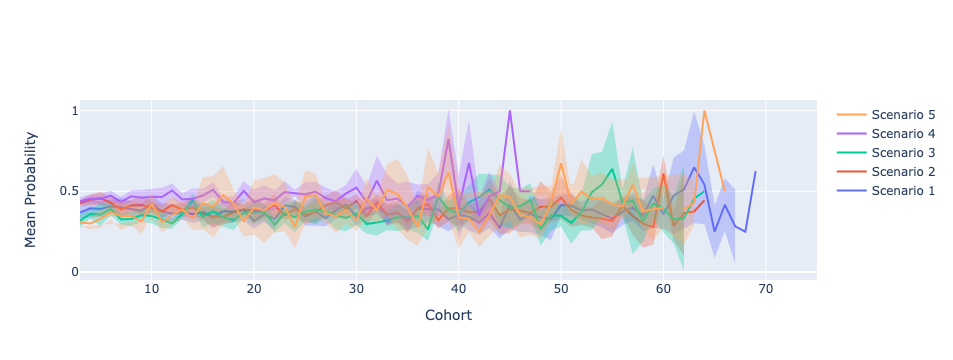

In [97]:
'''
    Continuous Graph
'''

import plotly.graph_objects as go

abs1["Scenario"] = abs1["Scenario"].astype(str)
scenarios = abs1["Scenario"].unique()

# Define a color map for the scenarios
color_map = {
    scenario: f"rgba({r}, {g}, {b}, 0.3)"
    for scenario, (r, g, b) in zip(scenarios, [(99, 109, 250), (239, 85, 59), (0, 204, 150), (171, 99, 250), (255, 162, 90)])
}




fig = go.Figure()

for scenario in scenarios:
    scenario_data = abs1[abs1["Scenario"] == scenario]
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['Probability_mean'],
                             name=f'Scenario {scenario}',
                             mode='lines',
                             line=dict(color=color_map[scenario].replace('0.3', '1')))
                 )
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['ci95_hi'],
                             name='Upper Bound of {}'.format(scenario),
                             mode='lines',
                             marker=dict(color="#444"),
                             line=dict(width=0),
                             showlegend=False))
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['ci95_lo'],
                             name='Lower Bound of {}'.format(scenario),
                             mode='lines',
                             marker=dict(color="#444"),
                             line=dict(width=0),
                             showlegend=False,
                             fillcolor=color_map[scenario],
                             fill='tonexty'
                            ))
fig.update_layout(
    xaxis_title="Cohort",
    yaxis_title="Mean Probability",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
    # showlegend=False
)

fig.show()

In [20]:
fig.write_image(project_path/"images/abs1_means2.png")
fig.write_html(project_path/"images/abs1_means.html") # with legend

## Method 2

In [98]:
# absolute.drop('Replication')
abs2 = absolute2.groupby(['Scenario', 'Cohort']).agg({'Probability': ["mean", "median", "var", "sem", "std"]}).reset_index()
abs2['ci95_hi'] = abs2['Probability']['mean'] + 1.96* abs2['Probability']['sem']
abs2['ci95_lo'] = abs2['Probability']['mean'] - 1.96* abs2['Probability']['sem']
abs2.columns = ['_'.join(col) for col in abs2.columns]
abs2.rename(columns = {'Scenario_':'Scenario', 'Cohort_':'Cohort', 'ci95_hi_': 'ci95_hi', 'ci95_lo_':'ci95_lo'}, inplace = True)
abs2

,Scenario,Cohort,Probability_mean,Probability_median,Probability_var,Probability_sem,Probability_std,ci95_hi,ci95_lo
0,1,3,0.368278,0.372768,0.003509,0.018733,0.059239,0.404995,0.331562
1,1,4,0.394438,0.373190,0.008489,0.029136,0.092137,0.451545,0.337331
2,1,5,0.390056,0.390476,0.005815,0.024114,0.076255,0.437319,0.342792
3,1,6,0.405786,0.398630,0.004566,0.021367,0.067569,0.447666,0.363906
4,1,7,0.401345,0.385705,0.009663,0.031086,0.098303,0.462273,0.340416
...,...,...,...,...,...,...,...,...,...
305,5,61,NaN,NaN,NaN,NaN,NaN,NaN,NaN
306,5,62,0.388889,0.500000,0.037037,0.111111,0.192450,0.606667,0.171111
307,5,63,0.428571,0.428571,0.010204,0.071429,0.101015,0.568571,0.288571
308,5,64,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN


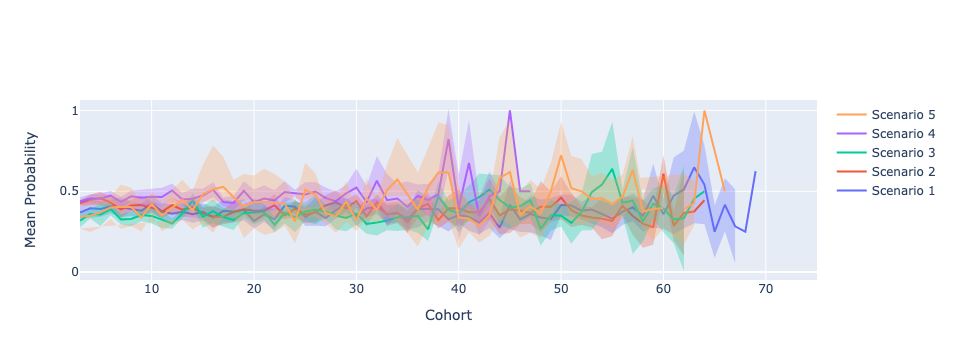

In [99]:
'''
    Continuous Graph
'''

import plotly.graph_objects as go

abs2["Scenario"] = abs2["Scenario"].astype(str)
scenarios = abs2["Scenario"].unique()

# Define a color map for the scenarios
color_map = {
    scenario: f"rgba({r}, {g}, {b}, 0.3)"
    for scenario, (r, g, b) in zip(scenarios, [(99, 109, 250), (239, 85, 59), (0, 204, 150), (171, 99, 250), (255, 162, 90)])
}




fig = go.Figure()

for scenario in scenarios:
    scenario_data = abs2[abs2["Scenario"] == scenario]
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['Probability_mean'],
                             name=f'Scenario {scenario}',
                             mode='lines',
                             line=dict(color=color_map[scenario].replace('0.3', '1')))
                 )
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['ci95_hi'],
                             name='Upper Bound of {}'.format(scenario),
                             mode='lines',
                             marker=dict(color="#444"),
                             line=dict(width=0),
                             showlegend=False))
    
    fig.add_trace(go.Scatter(x=scenario_data['Cohort'],
                             y=scenario_data['ci95_lo'],
                             name='Lower Bound of {}'.format(scenario),
                             mode='lines',
                             marker=dict(color="#444"),
                             line=dict(width=0),
                             showlegend=False,
                             fillcolor=color_map[scenario],
                             fill='tonexty'))
fig.update_layout(
    xaxis_title="Cohort",
    yaxis_title="Mean Probability",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
    # showlegend=False
)

fig.show()

In [18]:
fig.write_image(project_path/"images/abs2_means.png")
fig.write_html(project_path/"images/abs2_means.html") # with legend

### All

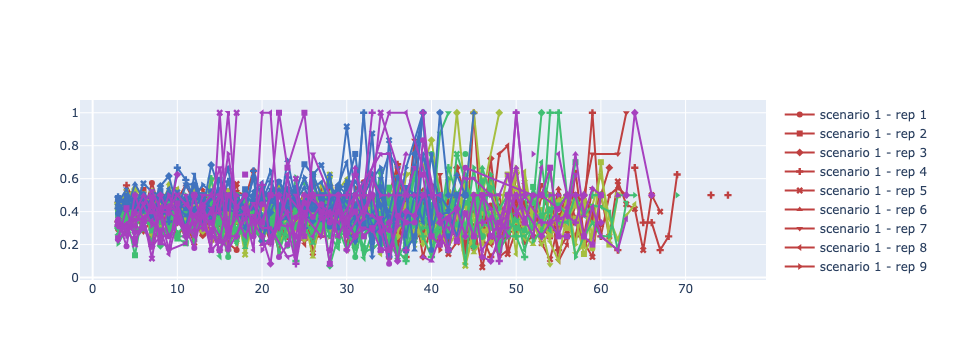

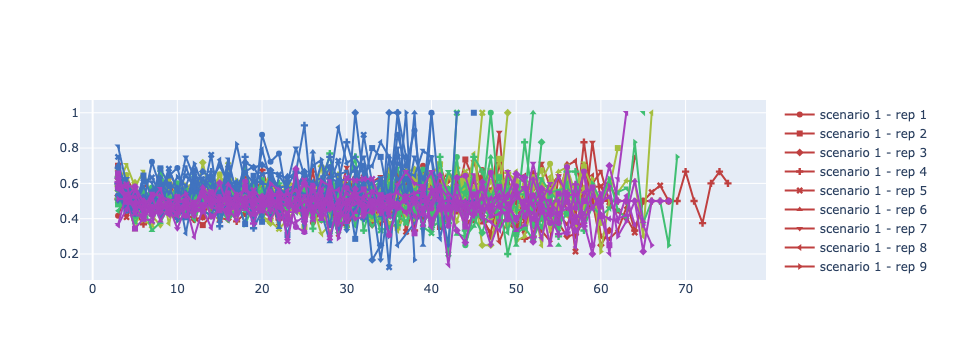

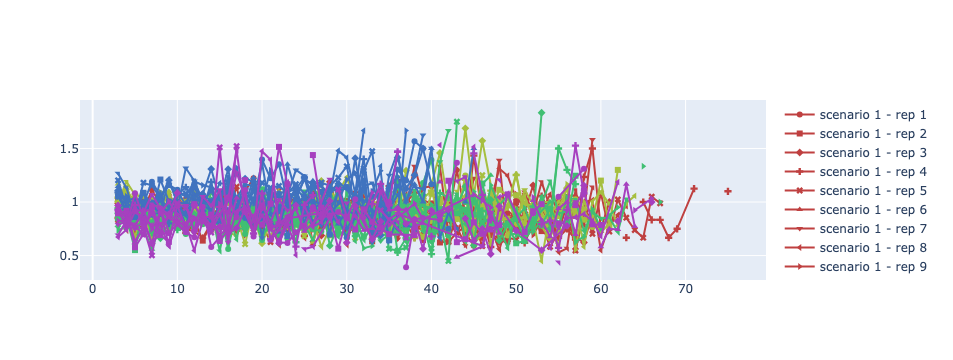

In [100]:
import plotly.graph_objects as go

# Create dictionary of dataframes
df_dict = {}
row = 0
for j in range(1, num_scen+1):
    for i in range(1, num_reps+1):
        key = f"scenario {j}"
        df = dfs[row]
        am1 = df[(df['Mother_Edu'] < 5) & (df['Father_Edu'] <5)]
        am2 = df[(df['Mother_Edu'] == 5) | (df['Father_Edu'] ==5)]
        counts = am1[(am1['Edu_level'] > am1['Mother_Edu']) & (am1['Edu_level'] > am1['Father_Edu'])].groupby('Cohort').size()
        counts2 = am2[(am2['Edu_level'] == 5)].groupby('Cohort').size()
        totals = am1.groupby(['Cohort']).size()
        totals2 = am2.groupby('Cohort').size()
        probs = counts/totals
        probs2 = counts2 / totals2
        probs3 = probs2 + probs
        if key in df_dict:
            df_dict[key].append({'Cohort': probs.index, 'Probability': probs.values, 'Cohort2': probs2.index, 'Probability2': probs2.values,
                                 'Probability3': probs3.values})
        else:
            df_dict[key] = [{'Cohort': probs.index, 'Probability': probs.values, 'Cohort2': probs2.index, 'Probability2': probs2.values,
                              'Probability3': probs3.values}]        
        row+=1

# Create list of replications and scenarios
replications = [f"rep {i}" for i in range(1, num_reps+1)]
scenarios = [f"scenario {j}" for j in range(1, num_scen+1)]

# Create figures
fig = go.Figure()
fig2 = go.Figure()
fig3 = go.Figure()

# Loop through each scenario
for i, scenario in enumerate(scenarios):
    # Get dataframes for current scenario
    dfs_scenario = df_dict[scenario]
    # Get color for current scenario
    color = f"hsl({(i/len(scenarios))*360}, 50%, 50%)"
    # Loop through each replication of the current scenario
    for j, df in enumerate(dfs_scenario):
        # Get name for current replication
        name = f"{scenario} - rep {j+1}"
        # Add traces to figures
        fig.add_trace(go.Scatter(x=df["Cohort"], y=df["Probability"],
                                  name=name,
                                  mode="lines+markers",
                                  line=dict(color=color),
                                  marker=dict(symbol=int(j))))
        fig2.add_trace(go.Scatter(x=df["Cohort2"], y=df["Probability2"],
                                   name=name,
                                   mode="lines+markers",
                                   line=dict(color=color),
                                   marker=dict(symbol=int(j))))
        fig3.add_trace(go.Scatter(x=df["Cohort"], y=df["Probability3"],
                                   name=name,
                                   mode="lines+markers",
                                   line=dict(color=color),
                                   marker=dict(symbol=int(j))))

# Show figures
fig.show()
fig2.show()
fig3.show()


# Relative Mobility
* See R Script

# Who Benefits?

In [19]:
dfs[0].columns

Index(['AgentID', 'Step', 'Age', 'Edu_level', 'Gender', 'Income', 'Generation',
       'Cohort', 'Weight', 'Capital', 'Brut', 'Child1', 'Child2', 'Mother',
       'Father', 'Partner', 'Education', 'Cultural', 'Economic', 'Social',
       'Child1_Edu', 'Child2_Edu', 'Child1_Income', 'Child2_Income',
       'Mother_Edu', 'Father_Edu', 'Mother_Income', 'Father_Income',
       'Mother_Cultural', 'Mother_Economic', 'Mother_Social',
       'Father_Cultural', 'Father_Economic', 'Father_Social', 'Scenario',
       'Replication'],
      dtype='object')

In [101]:
'''
    Make a function to create summary tables for each data set
'''
def summary_tab(df):
    ls = pd.DataFrame()
    row = 0
    for i in df.Cohort.unique():
        cht = df[df['Cohort'] == i]
        for j in range(1, 6):
            for k in range(1, 6):
                new = cht[(cht['Mother_Edu'] == j) | (cht['Father_Edu'] == k)]
                n = new.size
                avg = new['Edu_level'].mean()
                med = new['Edu_level'].median()
                ls.loc[row, 'Cohort'] = i
                ls.loc[row, 'Average Edu'] = avg
                ls.loc[row, 'Median Edu'] = med
                ls.loc[row, 'Total'] = n
                ls.loc[row, 'Mother Edu'] = j
                ls.loc[row, 'Father Edu'] = k
                row += 1
    return ls


In [102]:
ls_full = pd.DataFrame()
row = 0
for i in range(1, num_scen+1):
    for j in range(1,num_reps+1):
        df = dfs[row]
        df2 =  df[df['Generation'] != 1]
        df3 = summary_tab(df2)
        df3['Scenario'] = i
        df3['Replication'] = j
        ls_full = pd.concat([ls_full, df3], ignore_index=True)
        row +=1

In [103]:
# pd.set_option('display.max_rows', None)
ls_full

,Cohort,Average Edu,Median Edu,Total,Mother Edu,Father Edu,Scenario,Replication
0,7.0,3.888889,4.5,648.0,1.0,1.0,1,1
1,7.0,3.954545,4.0,792.0,1.0,2.0,1,1
2,7.0,3.950000,4.0,1440.0,1.0,3.0,1,1
3,7.0,4.137255,4.0,1836.0,1.0,4.0,1,1
4,7.0,4.343750,5.0,2304.0,1.0,5.0,1,1
...,...,...,...,...,...,...,...,...
66845,63.0,NaN,NaN,0.0,5.0,1.0,5,10
66846,63.0,NaN,NaN,0.0,5.0,2.0,5,10
66847,63.0,NaN,NaN,0.0,5.0,3.0,5,10
66848,63.0,NaN,NaN,0.0,5.0,4.0,5,10


In [157]:
# pd.set_option("display.max_rows", 25)

In [104]:
agg_ls = ls_full.groupby(['Scenario', 'Cohort', 'Mother Edu', 'Father Edu']).agg({'Average Edu': ["mean", "sem", "std"], 'Median Edu': ['mean', 'sem', 'std'] }).reset_index()
agg_ls['ci95_hi_avg'] = agg_ls['Average Edu']['mean'] + 1.96* agg_ls['Average Edu']['sem']
agg_ls['ci95_lo_avg'] = agg_ls['Average Edu']['mean'] - 1.96* agg_ls['Average Edu']['sem']
agg_ls['ci95_hi_med'] = agg_ls['Median Edu']['mean'] + 1.96* agg_ls['Median Edu']['sem']
agg_ls['ci95_lo_med'] = agg_ls['Median Edu']['mean'] - 1.96* agg_ls['Median Edu']['sem']
agg_ls.columns = ['_'.join(col) for col in agg_ls.columns]
agg_ls.rename(columns = {'Scenario_':'Scenario', 'Cohort_':'Cohort', 'Mother Edu_':'Mother Edu', 'Father Edu_':'Father Edu',
                         'ci95_hi_avg_': 'ci95_hi_avg', 'ci95_lo_avg_':'ci95_lo_avg',
                         'ci95_hi_med_': 'ci95_hi_med', 'ci95_lo_med_':'ci95_lo_med'}, inplace = True)

agg_ls['Parent Edu'] = agg_ls.apply(lambda x: [x['Mother Edu'], x['Father Edu']], axis=1)

agg_ls.head(5)

,Scenario,Cohort,Mother Edu,Father Edu,Average Edu_mean,Average Edu_sem,Average Edu_std,Median Edu_mean,Median Edu_sem,Median Edu_std,ci95_hi_avg,ci95_lo_avg,ci95_hi_med,ci95_lo_med,Parent Edu
0,1,3.0,1.0,1.0,1.805588,0.125877,0.398057,1.2,0.133333,0.421637,2.052307,1.558870,1.461333,0.938667,"[1.0, 1.0]"
1,1,3.0,1.0,2.0,2.405332,0.089751,0.283817,2.0,0.149071,0.471405,2.581244,2.229421,2.292180,1.707820,"[1.0, 2.0]"
2,1,3.0,1.0,3.0,3.160301,0.073470,0.232331,3.3,0.152753,0.483046,3.304301,3.016300,3.599395,3.000605,"[1.0, 3.0]"
3,1,3.0,1.0,4.0,3.436475,0.068618,0.216990,4.0,0.000000,0.000000,3.570967,3.301983,4.000000,4.000000,"[1.0, 4.0]"
4,1,3.0,1.0,5.0,3.553121,0.076782,0.242806,4.1,0.100000,0.316228,3.703614,3.402628,4.296000,3.904000,"[1.0, 5.0]"


## Plots

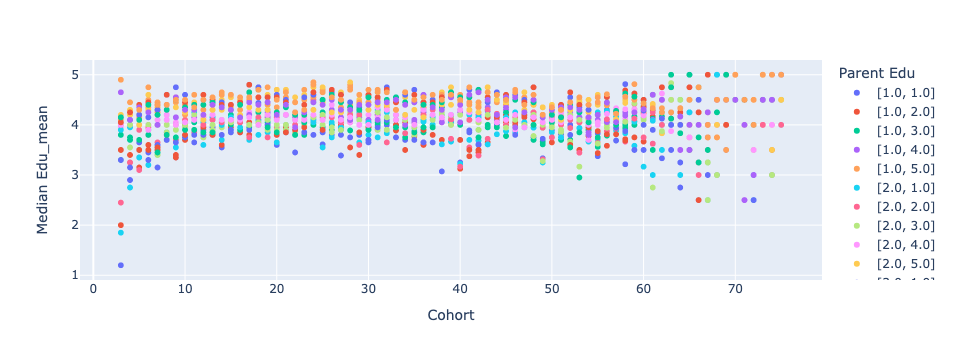

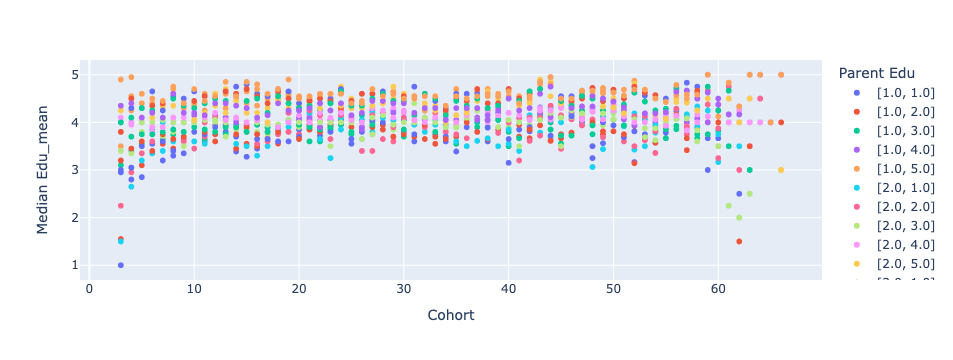

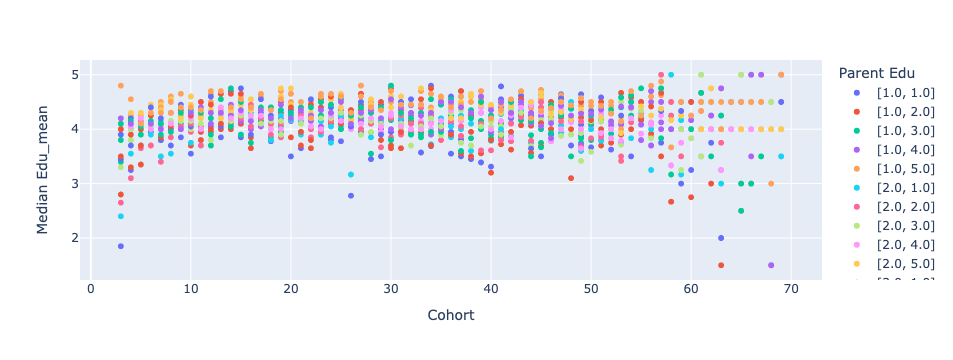

In [67]:
import plotly.express as px

agg_ls["Parent Edu"] = agg_ls["Parent Edu"].astype(str)
data = agg_ls[agg_ls['Scenario'] == 1]
fig1 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu')

data = agg_ls[agg_ls['Scenario'] == 2]
fig2 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu')

data = agg_ls[agg_ls['Scenario'] == 3]
fig3 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu')

fig1.show()
fig2.show()
fig3.show()

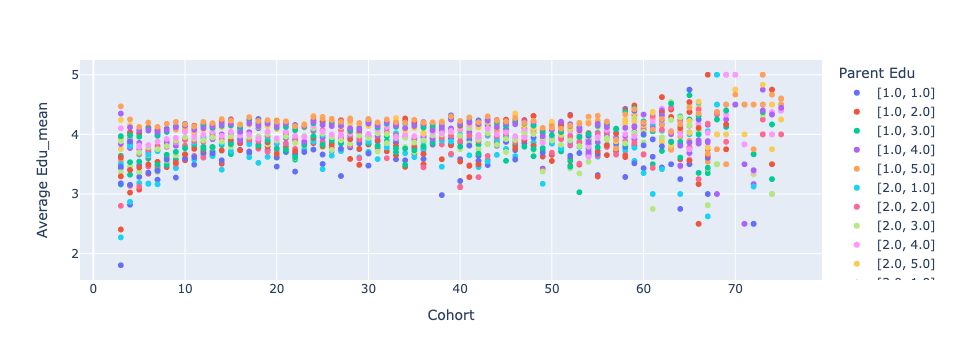

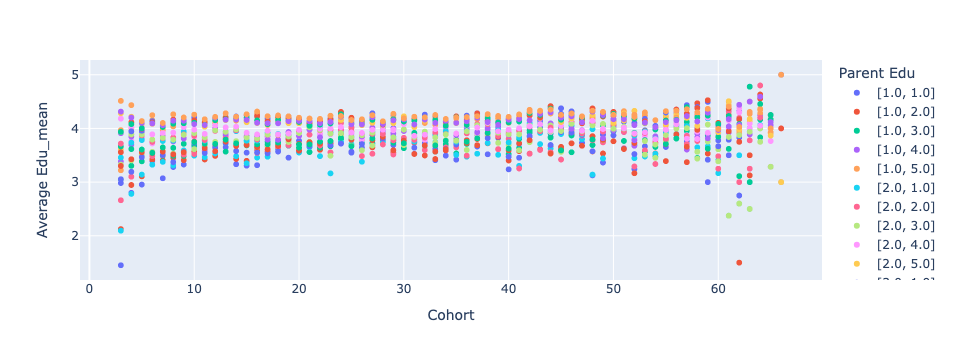

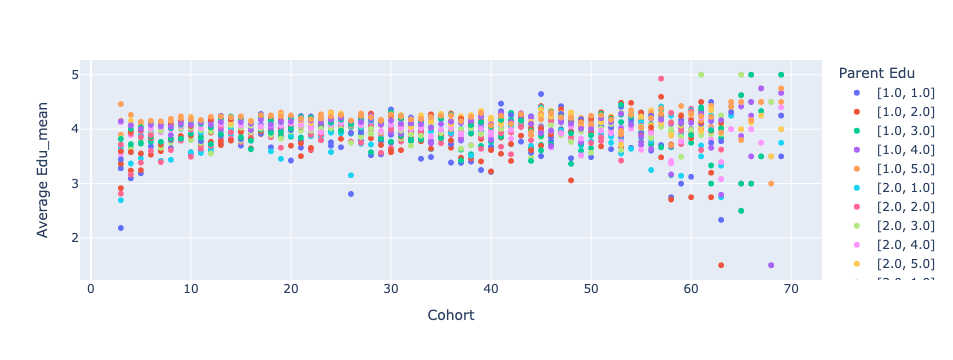

In [231]:
import plotly.express as px

agg_ls["Parent Edu"] = agg_ls["Parent Edu"].astype(str)
data = agg_ls[agg_ls['Scenario'] == 1]
fig1 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu')

data = agg_ls[agg_ls['Scenario'] == 2]
fig2 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu')

data = agg_ls[agg_ls['Scenario'] == 3]
fig3 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu')

fig1.show()
fig2.show()
fig3.show()

More mixing in scenario 3 compared to 1 and 2. 

In [106]:
agg_ls['Parent Edu 2'] = agg_ls['Parent Edu'].apply(lambda x: '[1, 2]' if x == '[1.0, 2.0]' or x == '[2.0, 1.0]'
                                                    else '[1, 3]' if x == '[1.0, 3.0]' or x == '[3.0, 1.0]'
                                                    else '[1, 4]' if x == '[1.0, 4.0]' or x == '[4.0, 1.0]' 
                                                    else '[1, 5]' if x == '[1.0, 5.0]' or x == '[5.0, 1.0]' 
                                                    else '[2, 3]' if x == '[2.0, 3.0]' or x == '[3.0, 2.0]' 
                                                    else '[2, 4]' if x == '[2.0, 4.0]' or x == '[4.0, 2.0]' 
                                                    else '[2, 5]' if x == '[2.0, 5.0]' or x == '[5.0, 2.0]'
                                                    else '[3, 4]' if x == '[3.0, 4.0]' or x == '[4.0, 3.0]'
                                                    else '[3, 5]' if x == '[3.0, 5.0]' or x == '[5.0, 3.0]' 
                                                    else '[4, 5]' if x == '[4.0, 5.0]' or x == '[5.0, 4.0]' 
                                                    else '[1, 1]' if x == '[1.0, 1.0]'
                                                    else '[2, 2]' if x == '[2.0, 2.0]'
                                                    else '[3, 3]' if x == '[3.0, 3.0]'
                                                    else '[4, 4]' if x == '[4.0, 4.0]'
                                                    else '[5, 5]' if x == '[5.0, 5.0]' 
                                                   else x)

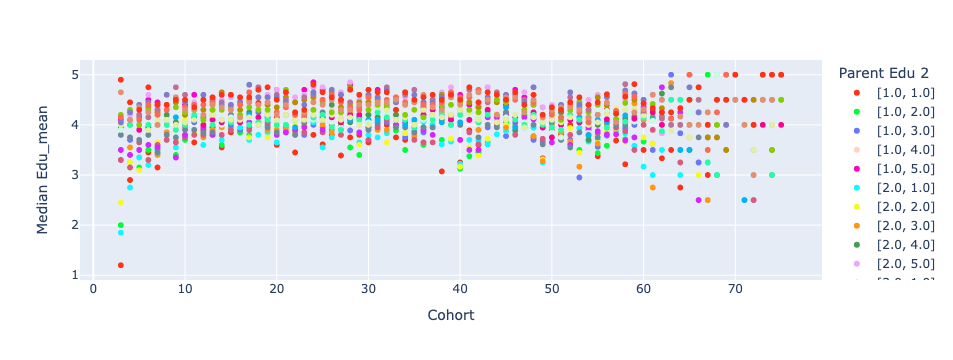

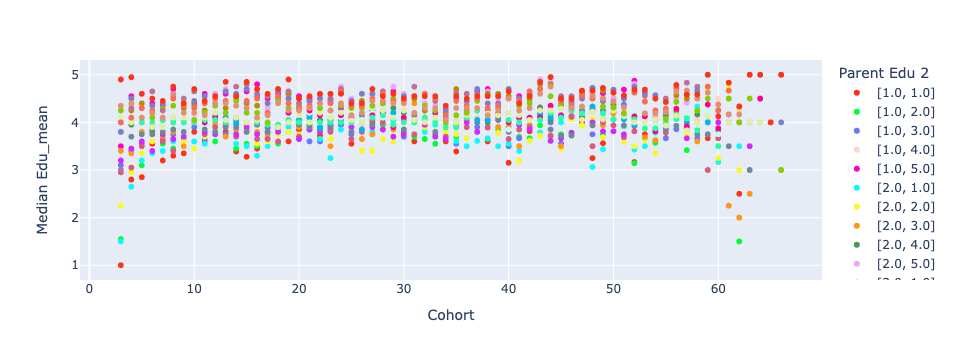

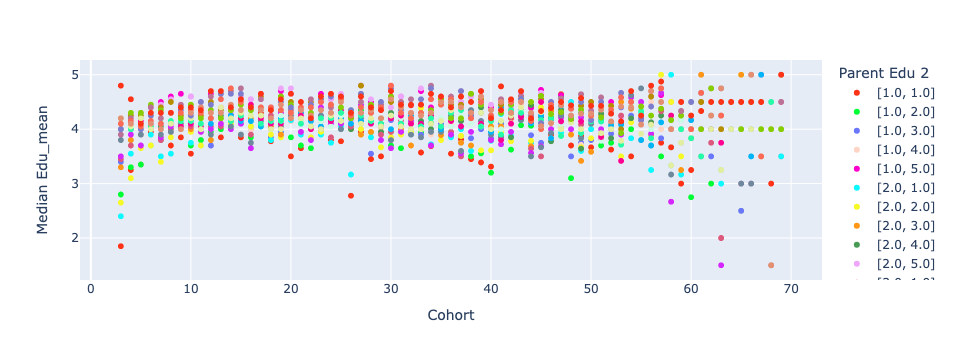

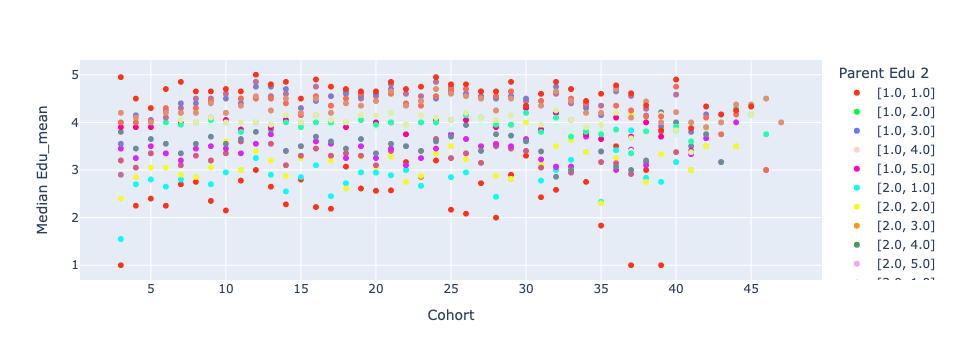

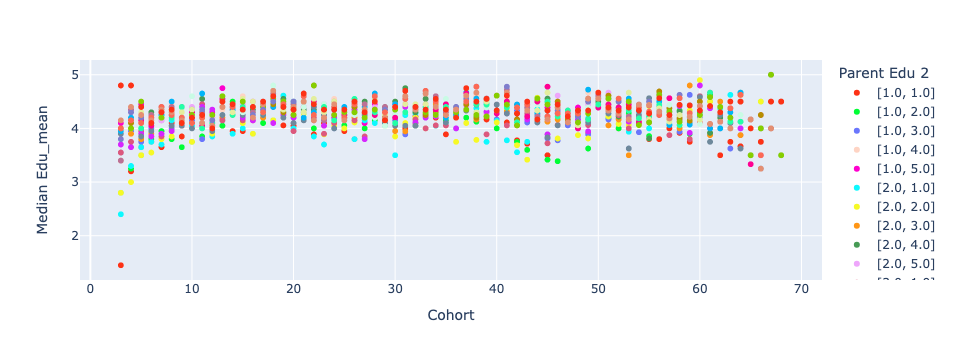

In [107]:
# Looking into average medians.

import plotly.express as px

agg_ls["Parent Edu 2"] = agg_ls["Parent Edu 2"].astype(str)
data = agg_ls[agg_ls['Scenario'] == 1]
fig1 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 2]
fig2 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 3]
fig3 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 4]
fig4 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 5]
fig5 = px.scatter(data, x='Cohort', y='Median Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)
fig1.show()
fig2.show()
fig3.show()
fig4.show()
fig5.show()

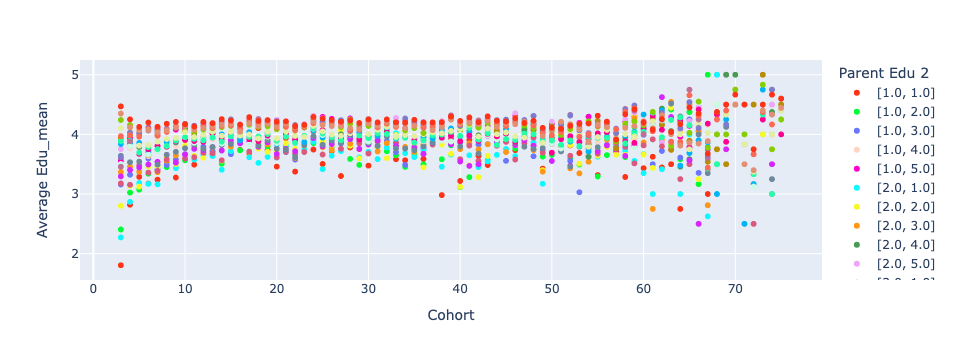

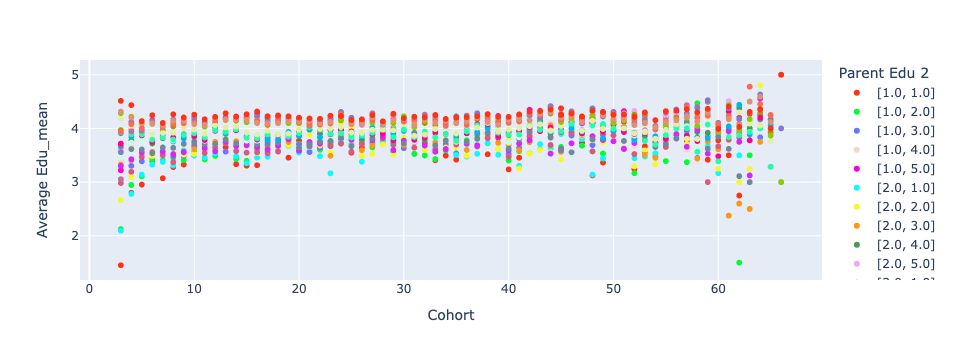

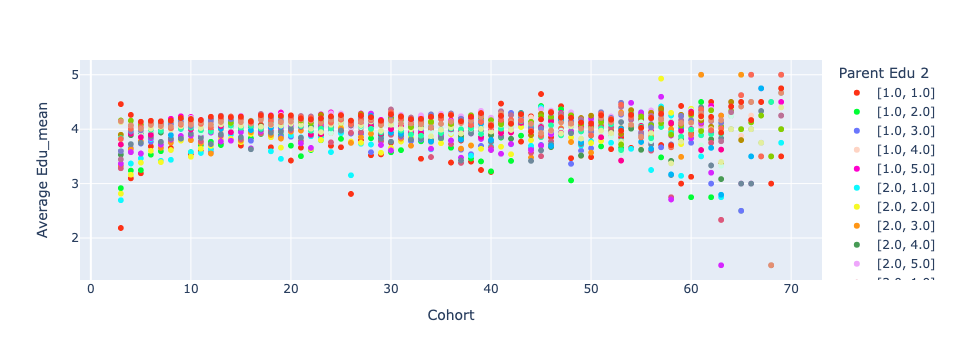

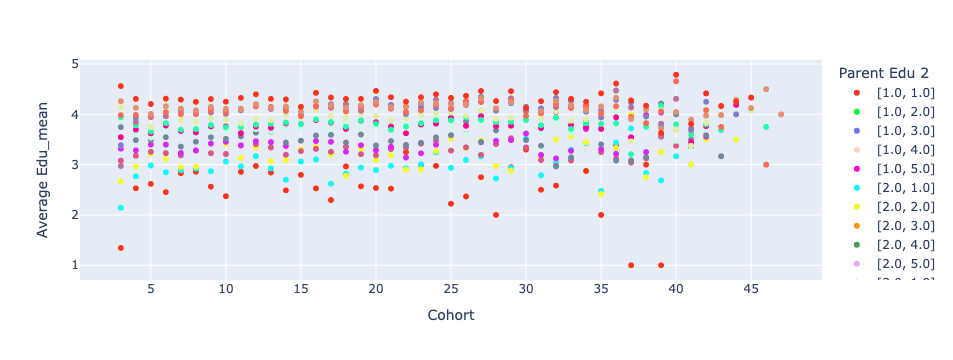

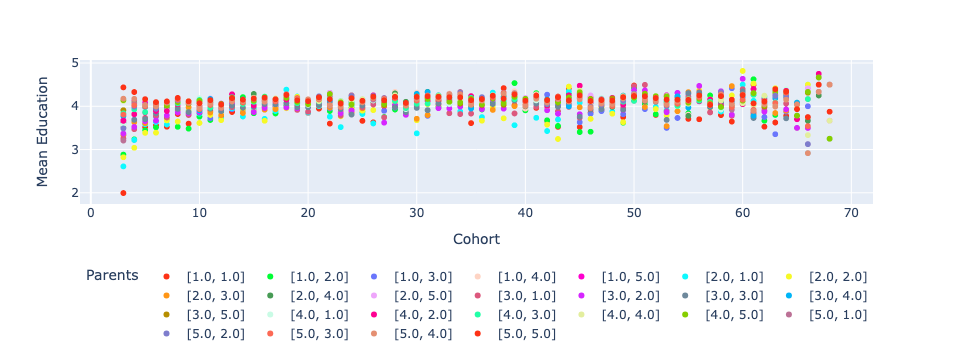

In [108]:
# Looking into average means.

import plotly.express as px

agg_ls["Parent Edu 2"] = agg_ls["Parent Edu 2"].astype(str)
data = agg_ls[agg_ls['Scenario'] == 1]
fig1 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 2]
fig2 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 3]
fig3 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 4]
fig4 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)

data = agg_ls[agg_ls['Scenario'] == 5]
fig5 = px.scatter(data, x='Cohort', y='Average Edu_mean', color='Parent Edu 2',
                 color_discrete_sequence=px.colors.qualitative.Light24)


# fig1.update_layout(legend=dict(
#     title = 'Parents',
#     orientation="h",
#     yanchor="bottom",
#     y=-1,
#     xanchor="right",
#     x=1),
#     xaxis_title="Cohort",
#     yaxis_title="Mean Education",
#     # paper_bgcolor='rgba(0,0,0,0)',
#     # plot_bgcolor = 'rgba(0,0,0,0)',
# )

# fig2.update_layout(legend=dict(
#     title = 'Parents',
#     orientation="h",
#     yanchor="bottom",
#     y=-1,
#     xanchor="right",
#     x=1),
#     xaxis_title="Cohort",
#     yaxis_title="Mean Education",
#     # paper_bgcolor='rgba(0,0,0,0)',
#     # plot_bgcolor = 'rgba(0,0,0,0)',
# )

fig5.update_layout(legend=dict(
    title = 'Parents',
    orientation="h",
    yanchor="bottom",
    y=-1,
    xanchor="right",
    x=1),
    xaxis_title="Cohort",
    yaxis_title="Mean Education",
    # paper_bgcolor='rgba(0,0,0,0)',
    # plot_bgcolor = 'rgba(0,0,0,0)',
)
fig1.show()
fig2.show()
fig3.show()
fig4.show()
fig5.show()

## Variance Differences?

In [382]:
agg_ls

,Scenario,Cohort,Mother Edu,Father Edu,Average Edu_mean,Average Edu_sem,Average Edu_std,Median Edu_mean,Median Edu_sem,Median Edu_std,ci95_hi_avg,ci95_lo_avg,ci95_hi_med,ci95_lo_med,Parent Edu,Parent Edu 2
0,1,3.0,1.0,1.0,1.805588,0.125877,0.398057,1.2,0.133333,0.421637,2.052307,1.558870,1.461333,0.938667,"[1.0, 1.0]","[1, 1]"
1,1,3.0,1.0,2.0,2.405332,0.089751,0.283817,2.0,0.149071,0.471405,2.581244,2.229421,2.292180,1.707820,"[1.0, 2.0]","[1, 2]"
2,1,3.0,1.0,3.0,3.160301,0.073470,0.232331,3.3,0.152753,0.483046,3.304301,3.016300,3.599395,3.000605,"[1.0, 3.0]","[1, 3]"
3,1,3.0,1.0,4.0,3.436475,0.068618,0.216990,4.0,0.000000,0.000000,3.570967,3.301983,4.000000,4.000000,"[1.0, 4.0]","[1, 4]"
4,1,3.0,1.0,5.0,3.553121,0.076782,0.242806,4.1,0.100000,0.316228,3.703614,3.402628,4.296000,3.904000,"[1.0, 5.0]","[1, 5]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5095,3,69.0,5.0,1.0,4.250000,NaN,NaN,4.5,NaN,NaN,NaN,NaN,NaN,NaN,"[5.0, 1.0]","[1, 5]"
5096,3,69.0,5.0,2.0,5.000000,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,"[5.0, 2.0]","[2, 5]"
5097,3,69.0,5.0,3.0,5.000000,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,"[5.0, 3.0]","[3, 5]"
5098,3,69.0,5.0,4.0,4.666667,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,"[5.0, 4.0]","[4, 5]"


In [232]:
var = agg_ls.groupby(['Scenario', 'Cohort']).agg({'Median Edu_mean': ["mean", "std"], 'Average Edu_mean': ["mean", "std"]}).reset_index()
var.columns = ['_'.join(col) for col in var.columns]
var.rename(columns = {'Scenario_':'Scenario', 'Cohort_':'Cohort', 'Median Edu_mean_mean': 'Med_Mean', 'Median Edu_mean_std': 'Med_Std', 'Average Edu_mean_mean': 'Avg_Mean', 'Average Edu_mean_std': 'Avg_Std'}, inplace = True)
var

,Scenario,Cohort,Med_Mean,Med_Std,Avg_Mean,Avg_Std
0,1,3.0,3.646000,0.880805,3.490934,0.636527
1,1,4.0,3.818000,0.454808,3.689232,0.421734
2,1,5.0,3.870000,0.372212,3.693628,0.324290
3,1,6.0,3.994000,0.399301,3.756913,0.313698
4,1,7.0,3.920000,0.379693,3.732800,0.302737
...,...,...,...,...,...,...
199,3,65.0,3.931818,0.820793,3.930303,0.832216
200,3,66.0,4.227273,0.631085,4.115530,0.583324
201,3,67.0,4.250000,0.516398,4.145833,0.484481
202,3,68.0,2.710526,1.346970,2.578947,1.227726


In [233]:
s1 = var[(var['Scenario'] == 1) & (var['Cohort'] < 50)]
s2 = var[(var['Scenario'] == 2) & (var['Cohort'] < 50)]
s3 = var[(var['Scenario'] == 3) & (var['Cohort'] < 50)]

In [252]:
print(s3.Med_Std.values-s2.Med_Std.values)
print(s3.Med_Std.values-s1.Med_Std.values)
print(s2.Med_Std.values-s1.Med_Std.values)

[-0.3076689  -0.2684566  -0.19659543 -0.16054117 -0.04953982 -0.18434338
 -0.14512589 -0.04550704 -0.09582101 -0.01048435 -0.11357639 -0.189843
 -0.14875835 -0.16533132 -0.11169519 -0.1507812  -0.03841684 -0.03063962
 -0.03330194 -0.08556404 -0.09500767 -0.04477478 -0.03875858  0.02978623
 -0.0723061   0.02692499 -0.08013223  0.05872776 -0.05267146 -0.05519698
 -0.02595229  0.10427885 -0.10739506  0.01405885  0.07052315  0.05789833
  0.08667103 -0.12353525 -0.08018009 -0.06390017 -0.17193999 -0.16512525
 -0.02655641  0.01047145 -0.00859743 -0.13938087  0.00540867]
[-0.22165738 -0.11132063 -0.10179551 -0.20895092 -0.1092457  -0.04156686
 -0.23024139  0.00396019 -0.00268403  0.01967538 -0.04929381 -0.10607318
  0.03933154  0.04608291 -0.14823063 -0.07767611  0.01630065 -0.06069624
 -0.07536208 -0.01822171  0.00826033 -0.03827028 -0.08620079  0.05629908
 -0.02318519 -0.02233687 -0.04534178  0.03953974 -0.02604862 -0.06854294
  0.05820344 -0.00318319 -0.03940767 -0.03572787  0.11661576  0.

In [402]:
# Mostly, s2's std is larger than s3's because we are looking at the data already organized by parents' educational level. 
# So in S2, mobility is more stable & smaller variance in mobility --> this is reflected as larger variance here. 
print(s3.Avg_Std.values**2-s2.Avg_Std.values**2) #10 S3 larger
print(s3.Avg_Std.values**2-s1.Avg_Std.values**2) #19 S3 larger
print(s2.Avg_Std.values**2-s1.Avg_Std.values**2) #14 S1 larger

[-2.90954345e-01 -1.12550593e-01 -4.00096935e-02 -5.40335763e-02
 -2.22907121e-02 -5.59847124e-02 -5.23928429e-02 -5.03145812e-03
 -1.63429996e-02 -1.40853681e-02 -1.79097145e-02 -5.63873049e-02
 -5.49356937e-02 -5.29475354e-02 -3.92790753e-02 -1.99711174e-02
 -3.36046958e-03 -1.33165253e-02  4.33685455e-04 -1.13927546e-02
 -4.72518947e-02 -3.52645382e-03 -1.83855771e-02  5.39085301e-02
 -1.92131080e-02  2.51698858e-02 -2.13633186e-02  8.76442400e-03
 -1.22770986e-02 -2.61236094e-02 -3.62328040e-02  7.29412791e-03
 -3.83507372e-02 -5.46644644e-03  1.38889528e-02  3.13237484e-02
  3.72599229e-02 -1.30155092e-02 -4.48339042e-02 -1.04307510e-02
 -3.04762384e-02 -2.92465420e-02  7.87103698e-03  1.83427437e-02
 -4.03011989e-05 -3.03137839e-02 -2.58981406e-02]
[-0.15198281 -0.07336775 -0.03212821 -0.07002906 -0.04201335 -0.01587223
 -0.05405017  0.00827235  0.00188244  0.00534575 -0.00887536 -0.05218344
 -0.00532352  0.01225927 -0.02967565 -0.00342212  0.00543791 -0.01722809
  0.00773586 -0.

# A More Detailed Assessment on Who Benefits

In [180]:
'''
    Make a function to create summary tables for each data set
'''
def simple_tab(df):
    ls = pd.DataFrame()
    row = 0
    for i in df.Cohort.unique():
        cht = df[df['Cohort'] == i]
        for j in range(1, 6):
            for k in range(1, 6):
                ls.loc[row, 'Cohort'] = i
                ls.loc[row, 'Mother Edu'] = j
                ls.loc[row, 'Father Edu'] = k
                row += 1
    return ls

In [181]:
ls_full2 = pd.DataFrame()
row = 0
for i in range(1, num_scen+1):
    for j in range(1,num_reps+1):
        df = dfs[row]
        df2 =  df[df['Generation'] != 1]
        df3 = simple_tab(df2)
        df3['Scenario'] = i
        df3['Replication'] = j
        df3['Edu_level'] = df['Edu_level']
        ls_full2 = pd.concat([ls_full2, df3], ignore_index=True)
        row +=1

In [183]:
ls_full2

,Cohort,Mother Edu,Father Edu,Scenario,Replication,Edu_level
0,7.0,1.0,1.0,1,1,4
1,7.0,1.0,2.0,1,1,2
2,7.0,1.0,3.0,1,1,3
3,7.0,1.0,4.0,1,1,3
4,7.0,1.0,5.0,1,1,4
...,...,...,...,...,...,...
42270,65.0,5.0,1.0,3,10,1
42271,65.0,5.0,2.0,3,10,5
42272,65.0,5.0,3.0,3,10,5
42273,65.0,5.0,4.0,3,10,5


In [184]:
ls_full2['Parent Edu'] = ls_full2.apply(lambda x: [x['Mother Edu'], x['Father Edu']], axis=1)
ls_full2['Parent Edu'] = ls_full2['Parent Edu'].astype(str)
ls_full2['Parent Edu 2'] = ls_full2['Parent Edu'].apply(lambda x: '[1, 2]' if x == '[1.0, 2.0]' or x == '[2.0, 1.0]'
                                                    else '[1, 3]' if x == '[1.0, 3.0]' or x == '[3.0, 1.0]'
                                                    else '[1, 4]' if x == '[1.0, 4.0]' or x == '[4.0, 1.0]' 
                                                    else '[1, 5]' if x == '[1.0, 5.0]' or x == '[5.0, 1.0]' 
                                                    else '[2, 3]' if x == '[2.0, 3.0]' or x == '[3.0, 2.0]' 
                                                    else '[2, 4]' if x == '[2.0, 4.0]' or x == '[4.0, 2.0]' 
                                                    else '[2, 5]' if x == '[2.0, 5.0]' or x == '[5.0, 2.0]'
                                                    else '[3, 4]' if x == '[3.0, 4.0]' or x == '[4.0, 3.0]'
                                                    else '[3, 5]' if x == '[3.0, 5.0]' or x == '[5.0, 3.0]' 
                                                    else '[4, 5]' if x == '[4.0, 5.0]' or x == '[5.0, 4.0]' 
                                                    else '[1, 1]' if x == '[1.0, 1.0]'
                                                    else '[2, 2]' if x == '[2.0, 2.0]'
                                                    else '[3, 3]' if x == '[3.0, 3.0]'
                                                    else '[4, 4]' if x == '[4.0, 4.0]'
                                                    else '[5, 5]' if x == '[5.0, 5.0]' 
                                                   else x)
ls_full2

,Cohort,Mother Edu,Father Edu,Scenario,Replication,Edu_level,Parent Edu,Parent Edu 2
0,7.0,1.0,1.0,1,1,4,"[1.0, 1.0]","[1, 1]"
1,7.0,1.0,2.0,1,1,2,"[1.0, 2.0]","[1, 2]"
2,7.0,1.0,3.0,1,1,3,"[1.0, 3.0]","[1, 3]"
3,7.0,1.0,4.0,1,1,3,"[1.0, 4.0]","[1, 4]"
4,7.0,1.0,5.0,1,1,4,"[1.0, 5.0]","[1, 5]"
...,...,...,...,...,...,...,...,...
42270,65.0,5.0,1.0,3,10,1,"[5.0, 1.0]","[1, 5]"
42271,65.0,5.0,2.0,3,10,5,"[5.0, 2.0]","[2, 5]"
42272,65.0,5.0,3.0,3,10,5,"[5.0, 3.0]","[3, 5]"
42273,65.0,5.0,4.0,3,10,5,"[5.0, 4.0]","[4, 5]"


In [195]:
ls_full3 = ls_full2.groupby(['Scenario', 'Cohort', 'Edu_level', 'Parent Edu 2'])['Parent Edu 2'].size().reset_index(name='Size')
ls_full3

,Scenario,Cohort,Edu_level,Parent Edu 2,Size
0,1,3.0,1,"[1, 1]",1
1,1,3.0,1,"[1, 2]",2
2,1,3.0,1,"[1, 3]",1
3,1,3.0,1,"[1, 5]",3
4,1,3.0,1,"[2, 3]",3
...,...,...,...,...,...
11786,3,69.0,5,"[2, 4]",1
11787,3,69.0,5,"[2, 5]",1
11788,3,69.0,5,"[3, 3]",1
11789,3,69.0,5,"[3, 4]",1


In [208]:
add = ls_full2.groupby(['Scenario', 'Cohort', 'Parent Edu 2'])['Parent Edu 2'].size().reset_index(name='Total')

ls_full4 = pd.merge(ls_full3, add)
ls_full4['Perc'] = ls_full4['Size']/ls_full4['Total']
ls_full4

,Scenario,Cohort,Edu_level,Parent Edu 2,Size,Total,Perc
0,1,3.0,1,"[1, 1]",1,10,0.1
1,1,3.0,2,"[1, 1]",2,10,0.2
2,1,3.0,3,"[1, 1]",1,10,0.1
3,1,3.0,4,"[1, 1]",2,10,0.2
4,1,3.0,5,"[1, 1]",4,10,0.4
...,...,...,...,...,...,...,...
11786,3,69.0,5,"[2, 4]",1,2,0.5
11787,3,69.0,4,"[3, 4]",1,2,0.5
11788,3,69.0,5,"[3, 4]",1,2,0.5
11789,3,69.0,4,"[3, 5]",2,2,1.0


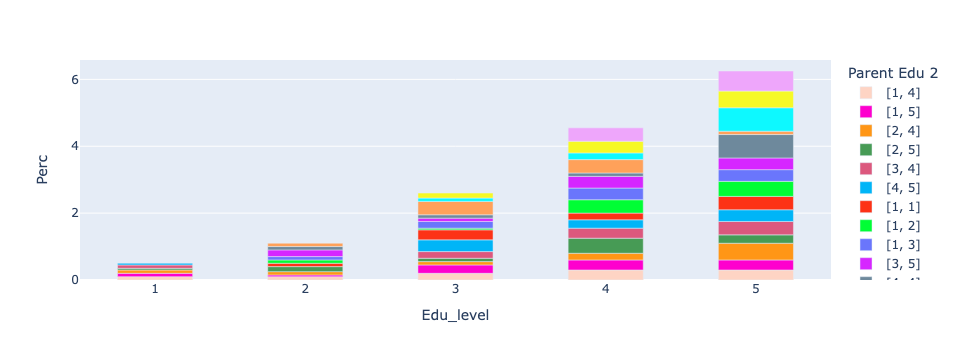

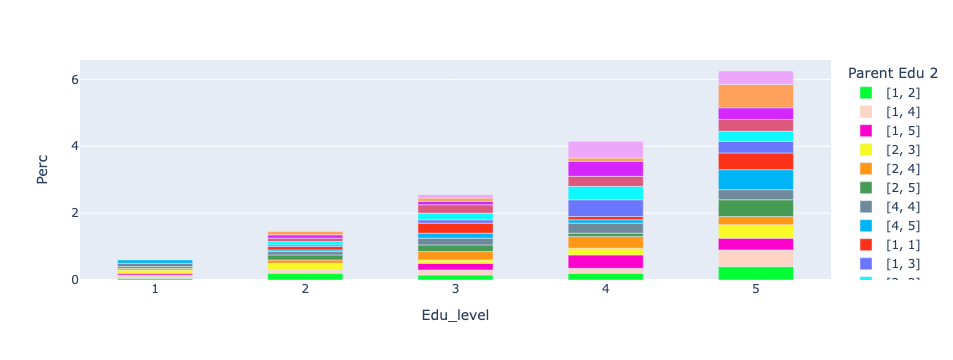

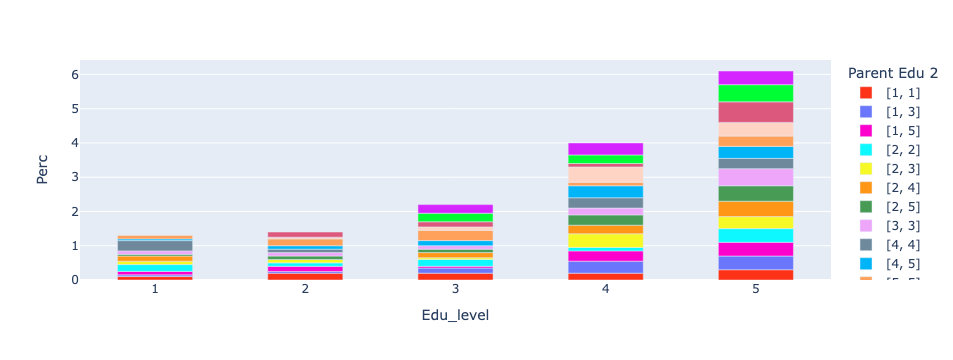

In [228]:
import plotly.express as px
colormap = {'[1, 1]': px.colors.qualitative.Light24[0], '[1, 2]': px.colors.qualitative.Light24[1],
            '[1, 3]': px.colors.qualitative.Light24[2], '[1, 4]': px.colors.qualitative.Light24[3],
            '[1, 5]': px.colors.qualitative.Light24[4], '[2, 2]': px.colors.qualitative.Light24[5],
            '[2, 3]': px.colors.qualitative.Light24[6], '[2, 4]': px.colors.qualitative.Light24[7],
            '[2, 5]': px.colors.qualitative.Light24[8], '[3, 3]': px.colors.qualitative.Light24[9],
            '[3, 4]': px.colors.qualitative.Light24[10], '[3, 5]': px.colors.qualitative.Light24[11],
            '[4, 4]': px.colors.qualitative.Light24[12], '[4, 5]': px.colors.qualitative.Light24[13]
           }

ls_full4["Parent Edu 2"] = ls_full4["Parent Edu 2"].astype(str)
ls_full4["Edu_level"] = ls_full4["Edu_level"].astype(str)

scenarios = [1, 2, 3]
cohort = 4 # Change the cohort
figs = []

for scenario in scenarios:
    data = ls_full4[(ls_full4['Scenario'] == scenario) & (ls_full4['Cohort'] == 4)]
    fig = px.bar(data, x='Edu_level', y='Perc', color='Parent Edu 2', color_discrete_map=colormap)
    fig.update_traces(width=0.5)
    figs.append(fig)

for fig in figs:
    fig.show()

# End